<a href="https://colab.research.google.com/github/TGandhi5473/APANProjects/blob/main/Assignment2APAN5430TGandhi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Getting the article and plain NER pipeline using Class Codebook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

file_path = '/content/drive/My Drive/webhose_apple.json'
df = pd.read_json(file_path, lines=True)
print(df.head())


                                              thread  \
0  {'uuid': '958670c1717dd8f1edbe33369ee12469c1ca...   
1  {'uuid': '4aa124a2c78843f8404405e65cd69da7bfae...   
2  {'uuid': '26ebb8ab008ed759d017994376326cc50809...   
3  {'uuid': 'cb43510b88a39af756c8744572f3f6e91155...   
4  {'uuid': 'cfe464ff046a7ad47b3fd6a13eac8eb7252d...   

                                       uuid  \
0  958670c1717dd8f1edbe33369ee12469c1cafdf1   
1  4aa124a2c78843f8404405e65cd69da7bfaed9c4   
2  26ebb8ab008ed759d017994376326cc508090c07   
3  cb43510b88a39af756c8744572f3f6e9115566ce   
4  cfe464ff046a7ad47b3fd6a13eac8eb7252d03e6   

                                                 url  ord_in_thread  \
0  http://omgili.com/ri/.wHSUbtEfZRyyLJKogCgQjT1s...              0   
1  http://omgili.com/ri/.wHSUbtEfZQVWCSCAg0UcdNr5...              0   
2  http://omgili.com/ri/.wHSUbtEfZQr3Bw_O2_O6hJpn...              0   
3  http://omgili.com/ri/.wHSUbtEfZS9pZjbkz0yttu0H...              0   
4  http://omgili.com/ri/.

In [ ]:
from IPython.display import HTML

def make_clickable(val):
  return '<a target="_blank" href="{}">{}</a>'.format(val, val)

df['external_links_clickable'] = df['external_links'].apply(lambda x: [make_clickable(v) for v in x])

# Display the DataFrame with clickable links
display(HTML(df[['external_links_clickable']].to_html(escape=False)))

,external_links_clickable
0,[]
1,"[https://www.theverifier.co.il/46415/ios-14-device-support-iphone-6s-iphone-se/, https://theverifier.co.il/46415/ios-14-device-support-iphone-6s-iphone-se/, https://theverifier.co.il/46415/ios-14-device-support-iphone-6s-iphone-se]"
2,"[https://www.twitter.com/onlyfanobtainer/status/1266933834064572416, https://twitter.com/onlyfanobtainer/status/1266933834064572416]"
3,"[https://bhavukjain.com/blog/2020/05/30/zeroday-signin-with-apple, https://bhavukjain.com/blog/2020/05/30/zeroday-signin-with-apple/, https://www.bhavukjain.com/blog/2020/05/30/zeroday-signin-with-apple/]"
4,[]
5,"[https://twitter.com/Campster/status/1267183124582215680?ref_src=twsrc%5Etfw, https://twitter.com/MarvelStudios/status/1267202512857096192, https://twitter.com/Campster/status/1267183124582215680, https://www.t.co/XT9tXF9hvz, https://twitter.com/MarvelStudios/status/1267202512857096192?ref_src=twsrc%5Etfw, https://www.twitter.com/Campster/status/1267183124582215680?ref_src=twsrc%5Etfw, https://t.co/XT9tXF9hvz, https://www.twitter.com/MarvelStudios/status/1267202512857096192?ref_src=twsrc%5Etfw]"
6,"[http://www.youtube.com/watch?v=cuvzu6wYd_Y, https://youtube.com/embed/cuvzu6wYd_Y, https://www.youtube.com/embed/cuvzu6wYd_Y, http://youtube.com/watch?v=cuvzu6wYd_Y, http://www.youtube.com/watch]"
7,[]
8,[]
9,"[https://www.forbes.com/sites/tommybeer/2020/06/01/independent-autopsy-finds-george-floyd-died-by-homicide-caused-by-asphyxia/#7b4d6e607f8f, https://www.reuters.com/article/us-snapchat-protests/facebook-snapchat-join-chorus-of-companies-condemning-george-floyd-death-racism-idUSKBN2382IG, https://forbes.com/sites/tommybeer/2020/06/01/independent-autopsy-finds-george-floyd-died-by-homicide-caused-by-asphyxia/#7b4d6e607f8f, https://press.snap.com/we-stand-together, https://www.press.snap.com/we-stand-together, https://www.twitter.com/elonmusk/status/1267409179339296768, https://bloomberg.com/news/articles/2020-05-31/apple-s-cook-says-painful-past-is-still-present-today-in-memo, https://reuters.com/article/us-snapchat-protests/facebook-snapchat-join-chorus-of-companies-condemning-george-floyd-death-racism-idUSKBN2382IG, https://twitter.com/elonmusk/status/1267409179339296768, https://www.bloomberg.com/news/articles/2020-05-31/apple-s-cook-says-painful-past-is-still-present-today-in-memo]"


In [17]:
#https://theconversation.com/uk-coronavirus-app-expert-verdict-strong-privacy-protection-and-added-benefits-138017
train='''
The UK is trialling its smartphone app to assist with contact tracing. The government is full of enthusiasm and the Isle of Wight is the guinea pig. But for all the fanfare and faith in its potential, is the right kind of tracing being done? And are we missing the human touch?

The idea behind the app is for those who download it to self-report symptoms of COVID-19 and receive alerts when the phones of users who may be infected come within transmission range. If enough people use it, claim supporters at the University of Oxford, it can get the epidemic under control. They also assert that it offers a way of gathering and transferring data that is cheaper and faster than traditional, manual methods of contact tracing.

Those older methods typically involve health officials carrying out in-depth questioning in person or over the phone, with subsequent follow-ups, to establish, monitor and control paths of human-to-human transmission. The process is certainly resource-heavy. It can also be very slow.

But arguing for the superiority of automated tracing for reasons of cost and speed risks ignoring the significant benefits of tracing carried out by people.

The problem with apps
Apps may improve the quality of data sharing and analysis but have little record of decisive application to contact tracing.

Learn about the latest, most interesting health and science research
Common obstacles met by phone-based technologies rolled out to tackle Ebola in West Africa, for instance, included network gaps, software problems and unfamiliarity with smartphones. Self-reporting of symptoms, meanwhile, was considered no substitute for professional, independent, in-person verification.

By contrast, manual methods of contact tracing have a rich history of accomplishment.

They contributed significantly to the eradication of smallpox and the containment of SARS. They enhance responses to sexually transmitted diseases such as HIV and remain a critical tool for tackling Ebola.Why manual tracing works
To understand this success, it is important to see that the benefits of manual tracing are not confined to finding people and recording their temperatures.

Of particular value is trained tracers’ ability to assess symptoms, detect asymptomatic carriers, and flag other possibilities for compromised health and onward spread, which untrained eyes – and apps – may struggle to spot.

In 2014, after three cases of Ebola were diagnosed in Texas, manual tracing identified 179 contacts. Defined as anyone who had been in physical contact with an infected case, within three feet of one for 15 minutes, or in a potentially contaminated shared space, they were found to include eight children of school age, three non-English speakers, two people with existing and serious health conditions and one person assessed to be homeless.

Manual tracing also offers a way to build trust among at-risk populations, especially when local norms, values and concerns are catered for with respect and empathy.

This can be particularly helpful in times like these, when individuals and communities in so many corners of the world are suspicious of state intentions and interventions, exposed to misinformation, or concerned about questions of confidentiality and the purposes to which data may be put.uring Allied military efforts to control a major outbreak of typhus in Naples during the second world war, teams of Italian-speaking US Army doctors joined up with local civilian nurses and priests to successfully trace dozens of cases.

We see further examples from Ebola to tuberculosis to HIV of vulnerable populations being more easily persuaded to comply with important control measures such as changing behaviour, sharing data and agreeing to isolation and treatment.

This can help to address, too, problems of stigma and segregation of people who are infected. Compassionate and connected contact tracers have also historically played important roles in soothing fears of positive diagnoses and supporting other aspects of mental health.

When Ebola was detected in Senegal, tracers’ demonstrable interest in contacts’ mental health and the provision of a hotline for psychological support helped foster public acceptance of containment measures.

No easy answers
Successful contact tracing is not easy. As the WHO observed at the height of West Africa’s Ebola outbreak:

Persons who conduct contact tracing should have investigative skills to find and track all potential contacts, and the ability to analyse the evidence. They also need to be flexible and empathic with the cases, contacts and their families in order to build trust and good community relations.Responses to past outbreaks tell us that tracing can indeed be time-consuming and expensive. To be effective, it must also be deployed among a battery of coordinated actions including isolation, testing and the development of vaccines.

Easy answers to epidemics are rare. “You cannot sit at a desk and do it,” as Brigadier General Leon A. Fox, a US Army medical officer tasked with halting typhus’s spread across Europe, observed at the end of second world war. “It takes a lot of drive, push, fight and work.”

Contact tracing remains a proven method of breaking chains of disease transmission, and, when capacity exists, ought to occupy a central role in bringing today’s pandemic to a close. And it will be at its best if those who embrace tracing’s potential appreciate its strengths as a process driven by humans.
Roderick Bailey receives funding from the Wellcome Trust. James Irvine does not work for, consult, own shares in or receive funding from any company or organization that would benefit from this article, and has disclosed no relevant affiliations beyond their academic appointment.
'''

test='''
The UK is trialling its smartphone app to assist with contact tracing. The government is full of enthusiasm and the Isle of Wight is the guinea pig. But for all the fanfare and faith in its potential, is the right kind of tracing being done? And are we missing the human touch?

The idea behind the app is for those who download it to self-report symptoms of COVID-19 and receive alerts when the phones of users who may be infected come within transmission range. If enough people use it, claim supporters at the University of Oxford, it can get the epidemic under control. They also assert that it offers a way of gathering and transferring data that is cheaper and faster than traditional, manual methods of contact tracing.

Those older methods typically involve health officials carrying out in-depth questioning in person or over the phone, with subsequent follow-ups, to establish, monitor and control paths of human-to-human transmission. The process is certainly resource-heavy. It can also be very slow.

But arguing for the superiority of automated tracing for reasons of cost and speed risks ignoring the significant benefits of tracing carried out by people.
Roderick Bailey receives funding from the Wellcome Trust.James Irvine does not work for, consult, own shares in or receive funding from any company or organization that would benefit from this article, and has disclosed no relevant affiliations beyond their academic appointment.
'''


In [ ]:
import re
re.search('Roderick Bailey',sents[2])

<re.Match object; span=(0, 15), match='Roderick Bailey'>

In [ ]:
re.search('Leon A. Fox',sents[0])

<re.Match object; span=(58, 69), match='Leon A. Fox'>

In [ ]:
re.search('James Irvine',sents[1])

<re.Match object; span=(0, 12), match='James Irvine'>

In [ ]:
re.search("UK",sents[3])

In [ ]:
re.search("Isle of Wight",sents[4])

In [1]:
sents = [
    "The UK is trialling its smartphone app to assist with contact tracing.",
    "The government is full of enthusiasm and the Isle of Wight is the guinea pig.",
    "If enough people use it, claim supporters at the University of Oxford, it can get the epidemic under control.",
    "In 2014, after three cases of Ebola were diagnosed in Texas, manual tracing identified 179 contacts.",
    "When Ebola was detected in Senegal, tracers’ demonstrable interest in contacts’ mental health and the provision of a hotline for psychological support helped foster public acceptance of containment measures.",
    "Common obstacles met by phone-based technologies rolled out to tackle Ebola in West Africa, for instance, included network gaps, software problems and unfamiliarity with smartphones.",
    "During Allied military efforts to control a major outbreak of typhus in Naples during the second world war, teams of Italian-speaking US Army doctors joined up with local civilian nurses and priests to successfully trace dozens of cases.",
    "As the WHO observed at the height of West Africa’s Ebola outbreak:",
    "“You cannot sit at a desk and do it,” as Brigadier General Leon A. Fox, a US Army medical officer tasked with halting typhus’s spread across Europe, observed at the end of second world war.",
    "Roderick Bailey receives funding from the Wellcome Trust.",
    "James Irvine does not work for, consult, own shares in or receive funding from any company or organization that would benefit from this article, and has disclosed no relevant affiliations beyond their academic appointment."
]

TRAIN_DATA = [
    (sents[0], {'entities': [(4, 6, "LOCATION")]}),
    (sents[1], {'entities': [(42, 56, "LOCATION")]}),
    (sents[2], {'entities': [(46, 67, "ORGANIZATION")]}),
    (sents[3], {'entities': [(49, 54, "LOCATION")]}),
    (sents[4], {'entities': [(31, 37, "LOCATION")]}),
    (sents[5], {'entities': [(70, 81, "LOCATION")]}),
    (sents[6], {'entities': [(79, 85, "LOCATION"), (128, 134, "ORGANIZATION")]}),
    (sents[7], {'entities': [(7, 10, "ORGANIZATION"), (37, 48, "LOCATION")]}),
    (sents[8], {'entities': [(41, 56, "PERSON"), (60, 74, "PERSON"), (78, 90, "ORGANIZATION"), (118, 124, "LOCATION")]}),
    (sents[9], {'entities': [(0, 15, "PERSON"), (40, 54, "ORGANIZATION")]}),
    (sents[10], {'entities': [(0, 12, "PERSON")]}),
]


In [2]:
import spacy
nlp = spacy.blank('en')

In [3]:
source_nlp = spacy.load("en_core_web_sm")
ner = nlp.add_pipe("ner", source=source_nlp)
ner.labels

('CARDINAL',
 'DATE',
 'EVENT',
 'FAC',
 'GPE',
 'LANGUAGE',
 'LAW',
 'LOC',
 'MONEY',
 'NORP',
 'ORDINAL',
 'ORG',
 'PERCENT',
 'PERSON',
 'PRODUCT',
 'QUANTITY',
 'TIME',
 'WORK_OF_ART')

In [4]:
for _, annotations in TRAIN_DATA:
    for ent in annotations.get("entities"):
        ner.add_label(ent[2])

In [5]:
from spacy.training import Example

n_iter = 200
loss_history=[]
with nlp.select_pipes(enable=["ner"]):
    #optimizer = nlp.begin_training()
    optimizer = nlp.create_optimizer()
    for itn in range(n_iter):
        losses = {}
        texts, annotations = zip(*TRAIN_DATA)
        examples = []
        for i in range(len(texts)):
            doc = nlp.make_doc(texts[i])
            example = Example.from_dict(doc, annotations[i])
            examples.append(example)
        nlp.update(examples, drop=0.5, losses=losses, sgd=optimizer)
        loss_history.append(losses['ner'])

/usr/local/lib/python3.11/dist-packages/spacy/training/iob_utils.py:149: UserWarning: [W030] Some entities could not be aligned in the text "The government is full of enthusiasm and the Isle ..." with entities "[(42, 56, 'LOCATION')]". Use `spacy.training.offsets_to_biluo_tags(nlp.make_doc(text), entities)` to check the alignment. Misaligned entities ('-') will be ignored during training.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/spacy/training/iob_utils.py:149: UserWarning: [W030] Some entities could not be aligned in the text "If enough people use it, claim supporters at the U..." with entities "[(46, 67, 'ORGANIZATION')]". Use `spacy.training.offsets_to_biluo_tags(nlp.make_doc(text), entities)` to check the alignment. Misaligned entities ('-') will be ignored during training.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/spacy/training/iob_utils.py:149: UserWarning: [W030] Some entities could not be aligned in the text "In 2014, after three cases of Ebola w

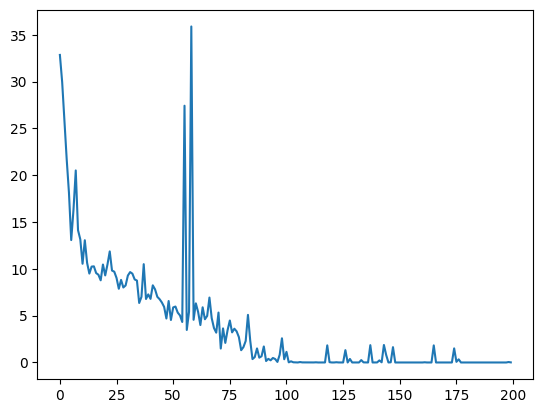

In [6]:
import matplotlib.pyplot as plt
plt.plot(loss_history)

In [9]:
from spacy import displacy
doc = nlp(test)
displacy.render(doc, 'ent')

#Part 2 - IBM's API

In [3]:
pip install ibm_watson

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 342.8/342.8 kB 5.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.4/69.4 kB 2.5 MB/s eta 0:00:00
  Created wheel for ibm_watson: filename=ibm_watson-9.0.0-py3-none-any.whl size=345042 sha256=89389dc0ced63da42ba8f365ac66d3924df4aa5811257169936e2b7c017be4b9
  Stored in directory: /root/.cache/pip/wheels/a1/ed/65/5abe3aa86c063331a8064910b7722d22ddf0bd75fc322f6c48
Successfully built ibm_watson


In [4]:

import json
from ibm_watson import NaturalLanguageUnderstandingV1
from ibm_cloud_sdk_core.authenticators import IAMAuthenticator
from ibm_watson.natural_language_understanding_v1 \
    import Features, EntitiesOptions

apikey="Tar0sZS7v9wqeAsGvaESdaz_JHwq1nVEc8TFGgr7pQU4"
authenticator = IAMAuthenticator(apikey)
natural_language_understanding = NaturalLanguageUnderstandingV1(
    version='2022-04-07',
    authenticator=authenticator
)

natural_language_understanding.set_service_url("https://api.us-east.natural-language-understanding.watson.cloud.ibm.com/instances/16d9b81d-0970-46c9-a20c-803ea2b58ea9")

response = natural_language_understanding.analyze(
    url='https://theconversation.com/uk-coronavirus-app-expert-verdict-strong-privacy-protection-and-added-benefits-138017',
    features=Features(entities=EntitiesOptions(sentiment=True,limit=50))).get_result()

print(json.dumps(response, indent=2))


{
  "usage": {
    "text_units": 1,
    "text_characters": 5817,
    "features": 1
  },
  "retrieved_url": "https://theconversation.com/uk-coronavirus-app-expert-verdict-strong-privacy-protection-and-added-benefits-138017",
  "language": "en",
  "entities": [
    {
      "type": "Organization",
      "text": "UK app",
      "sentiment": {
        "score": 0,
        "mixed": "1",
        "label": "neutral"
      },
      "relevance": 0.950981,
      "count": 2,
      "confidence": 0.826968
    },
    {
      "type": "Organization",
      "text": "NHSX",
      "sentiment": {
        "score": -0.52069,
        "label": "negative"
      },
      "relevance": 0.903754,
      "count": 2,
      "confidence": 0.948002
    },
    {
      "type": "Organization",
      "text": "UK\u2019s",
      "sentiment": {
        "score": -0.318894,
        "mixed": "1",
        "label": "negative"
      },
      "relevance": 0.853168,
      "count": 1,
      "confidence": 0.423158
    },
    {
      "type"

In [12]:
import json
import pprint
# Assuming 'response' is the JSON output
entity_label_tuples = []
for entity in response['entities']:  # Accessing the 'entities' list
    if entity['type'] in ['JobTitle', 'Location', "Organization"]:  # Include "Organization"
        entity_label_tuples.append((entity['type'], entity['text']))

pprint.pprint(entity_label_tuples, compact=True)

[('Organization', 'UK app'), ('Organization', 'NHSX'), ('Organization', 'UK’s'),
 ('Organization', 'government healthcare technology agency'),
 ('Organization', 'NHS'), ('Organization', 'Australian app'),
 ('Location', 'Isle of Wight'), ('JobTitle', 'researchers'),
 ('Organization', 'Android'), ('JobTitle', 'engineers'), ('Organization', 'UK'),
 ('Location', 'Germany'), ('Location', 'Australia'), ('Location', 'UK'),
 ('Organization', 'Apple'), ('Organization', 'NHS app'),
 ('Organization', 'Google'), ('Organization', 'GPS')]


In [13]:
from google.colab import files
files.download('Assignment2APAN5430TGandhi.ipynb')

FileNotFoundError: Cannot find file: Assignment2APAN5430TGandhi.ipynb